In [14]:
# Imports
from scipy import sparse
import scipy
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import time
from numpy import linalg as LA

# Frank-Wolfe - standard algorithm

In [6]:
# FW objective function
def FW_objective_function(diff_vec):
    return 0.5*(np.power(diff_vec,2).sum())

# Regular FW algorithm
def FrankWolfe(X, objective_function, delta, empties = 0, printing_res = True, Z_init = None, max_iter = 150, patience = 1e-3):
    '''
    :param X: sparse matrix with ratings and 'empty values', rows - users, columns - books.
    :param objective_function: objective function that we would like to minimize with FW
    :param delta: Radius of the feasible's set ball
    :param empties (optional): Empty values of X are zeros (0) or NaN ('nan'). Default = 0
    :param Z_init (optional): In case we want to initialize Z with a known matrix, if not given Z_init will be a zeros matrix. Default = None.
    :param max_iter (optional): max number of iterations for the method. Default = 150.
    :param patience (optional): once reached this tolerance provide the result. Default = 1e-3.
    :return: Z: matrix of predicted ratings - it should be like X but with no 'empty values'
    :return: accuracy: difference between original values (X) and predicted ones (Z)
    '''
    ranks = []
    # Get X indexes for not empty values
    if empties == 0:
        idx_ratings = np.argwhere(X != 0)
    elif empties == 'nan':
        idx_ratings = np.argwhere(~np.isnan(X))
    else:
        return print('Error: Empties argument', empties, 'not valid.')

    idx_rows = idx_ratings[:,0]
    idx_cols = idx_ratings[:,1]

    # Initialize Z
    if Z_init == 'random uniform':
        Z = np.random.uniform(low = 0.01, high = 1, size = X.shape)
    elif Z_init is not None:
        Z = Z_init
    else:
        Z = np.zeros(X.shape)

    # Create vectors with the not empty features of the sparse matrix
    X_rated = X[idx_rows, idx_cols]
    Z_rated = Z[idx_rows, idx_cols]
    diff_vec = np.array(Z_rated - X_rated)[0]

    # Create needed variables
    diff_loss = patience + 1
    loss = objective_function(diff_vec)
    res_list = [loss]
    it = 0
    while (diff_loss > patience) and (it < max_iter):

        # Gradient
        grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))

        # SVD - Compute k = 1 singular values and its vectors, starting from the largest (which = 'LM')
        u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')   #

        # Update
        Zk_tilde = -delta*np.outer(u_max,v_max)

        alpha_k = 2/(it+2) #alpha - as studied in class
        Z = (1-alpha_k)*Z + alpha_k*Zk_tilde

        # Loss
        diff_vec = np.array(Z[idx_rows, idx_cols] - X_rated)[0]
        new_loss = objective_function(diff_vec)

        # Improvement at this iteration
        diff_loss = np.abs(loss - new_loss)
        loss = new_loss

        if printing_res == True:
            if it == 1 or it % 50 == 0:
                print('Iteration:', it, 'Loss:', loss, 'Loss diff:', diff_loss)

        # Count iteration
        it += 1
        ranks.append(np.linalg.matrix_rank(Z))
        res_list.append(loss)
        
    return Z, loss, res_list, ranks

# Frank-Wolfe In-face

In [16]:
# Binary search for alpha stop
def alpha_binary_search(Zk, Dk, delta, max_value = 1, min_value = 0, tol = 0.1):

    #Inizialization

    best_alpha = step = (max_value - min_value) / 2

    #Binary Search

    while step >= tol:
        testing_matrix = Zk + best_alpha * Dk
        testing_mat_nuclear_norm = LA.norm(testing_matrix, ord = 'nuc')
        step = step / 2 
        
        if testing_mat_nuclear_norm > delta:
            best_alpha = best_alpha + step
        if testing_mat_nuclear_norm <= delta:
            best_alpha = best_alpha - step

    return best_alpha

In [132]:
# # Evaluate Best Beta
# def compute_best_beta(grad, Dk, L, alpha_stop):

#   grad = grad.toarray()

#   operator1 = -np.dot(grad.T, Dk)
#   operator2 = L * LA.norm(Dk)**2
#   fraction = operator1/operator2
#   fraction = fraction.sum()

#   if fraction < alpha_stop:
#     best_beta = fraction

#   else:
#     best_beta = alpha_stop

#   return best_beta

In [4]:
def compute_best_beta(Zk, X_rated, Dk, idx_rows, idx_cols, alpha_stop, stepsize = 0.003, tol = 0.001):
    best_beta = alpha_stop / 2
    step = tol
    while step >= tol:
        Zk = Zk + best_beta * Dk                              # compute new Zk
        Z_rated = Zk[idx_rows, idx_cols]                      # take only known values
        diff_vec = np.array(Z_rated - X_rated)[0].sum()       # compute the difference vector

    #loss = 0.5*(np.power(diff_vec,2).sum())              # compute the loss # didn't take this one because it's always positive!

        step = diff_vec * stepsize

        best_beta = best_beta + step

        if best_beta <= 0:
            best_beta = 0
            break

        if best_beta >= alpha_stop:
            best_beta = alpha_stop
            break
    print(best_beta)

    return best_beta

In [7]:
def FW_inface(X, objective_function, delta, L = 1, D = None, gamma1 = 0, gamma2 = 1, THRES = 0.001, empties = 0, max_iter=150, patience=1e-3, printing = True, delta_change = False):
    '''
    :param X: sparse matrix with ratings and 'empty values', rows - users, columns - books.
    :param objective_function: objective function that we would like to minimize with FW.
    :param delta: Radius of the feasible's set ball
    :param L: must be greater than 1
    :param D: if not inputed = 2*delta
    :param gamma1:
    :param gamma2:
    :param THRES:
    :param empties (optional): Empty values of X are zeros (0) or NaN ('nan'). Default = 0
    :param max_iter: max number of iterations for the method.
    :param patience: once reached this tolerance provide the result.
    :return: Z: matrix of predicted ratings - it should be like X but with no 'empty values'
            loss: difference between original values (X) and predicted ones (Z).
    '''

    # Get X indexes for not empty values
    if empties == 0:
        idx_ratings = np.argwhere(X != 0)
    elif empties == 'nan':
        idx_ratings = np.argwhere(~np.isnan(X))
    else:
        return print('Empties argument', empties, 'not valid.')

    idx_rows = idx_ratings[:,0]
    idx_cols = idx_ratings[:,1]

    # Initialize Z_{-1}
    Z_1 = np.zeros(X.shape)

    # Create vectors with the not empty features of the sparse matrix
    X_rated = X[idx_rows, idx_cols]
    Z_rated = Z_1[idx_rows, idx_cols]
    diff_vec_1 = np.array(Z_rated - X_rated)[0]

    # Initial gradient and Z0
    grad_1 = sparse.csr_matrix((diff_vec_1, (idx_rows, idx_cols)))
    u_max, s_max, v_max = sparse.linalg.svds(grad_1, k = 1, which='LM')
    Zk = -delta*np.outer(u_max,v_max)
    Z_rated = Zk[idx_rows, idx_cols]

    print('Initial Zk Rank: ', LA.matrix_rank(Zk))

    # Initialize lower bound on the optimal objective function (f*)
    diff_vec = np.array(Z_rated - X_rated)[0]
    #new_low_bound = np.max((objective_function(diff_vec_1) + np.multiply(grad_1.toarray(),Zk).sum()), 0)
    new_low_bound = 0
    #new_low_bound = np.max((objective_function(diff_vec_1) + (grad_1.dot(Zk)).trace()), 0)
    #new_low_bound = 0 #used 0 otherwise the other new_low_bound was too high!

    # Set D
    if D is not None:
        D = D
    else:
        D = 2*delta

    rank_Z = LA.matrix_rank(Zk)   # rank of Zk to find thin SVD size

    # Additional needed parameters
    diff_loss = patience + 1
    loss = objective_function(diff_vec)
    it = 0
    res_list = [objective_function(diff_vec_1), loss]
    ranks = [rank_Z]
    not_in_ball=False

    B_used = 0
    A_used = 0
    not_entered = 0
    regularFW = 0

    in_border = 0
    inside = 0
    outside = 0

    while (diff_loss > patience) and (it < max_iter):

        # Thin SVD
        U_thin, s_thin, Vh_thin = sparse.linalg.svds(Zk, k = rank_Z, which='LM')   # Compute k = rank singular values

        # Lower bound update
        low_bound = new_low_bound

        # Gradient
        grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))

        # In-face direction with the away step strategy: two calculations depending of where Z lies within the feasible set
        if np.isclose(s_thin.sum(), delta, rtol=1e-3)==True: # Z in border (sum of singular values == radius of feasible set)
            in_border += 1
            G = 0.5 * (Vh_thin.dot(grad.T.dot(U_thin)) + U_thin.T.dot(grad.dot(Vh_thin.T)))
            # Obtain unitary eigenvector corresponding to smallest eigenvalue of G
            eigvalues, eigvectors = LA.eig(G)  #find the eigenvalues
            min_eig = np.argmin(eigvalues)  #find the index of the smallest eigenvalue
            u = eigvectors[:, min_eig]  #take the eigenvector corresponding to the smallest eigenvalue

            # Update value
            M = np.outer(u,u.T)
            Zk_tilde = delta*U_thin.dot(M.dot(Vh_thin))
            Dk = Zk - Zk_tilde

            inv_s_thin = np.diag(1/s_thin)
            alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)

        elif s_thin.sum() < delta: #inside
            inside += 1
            u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
            Zk_tilde = delta*np.outer(u_max,v_max)
            Dk = Zk - Zk_tilde
            #BINARY SEARCH

            alpha_stop = alpha_binary_search(Zk,
                                          Dk,
                                          delta)

        else:
            not_in_ball = True
            outside += 1

        #nuclear_norm = s_thin.sum()
        # We check if Zk is inside the feasible set and the rank in order to decide which type steps to do
        if rank_Z > 1 and not_in_ball==False:
            if delta_change is True:
                delta = delta * (1 -0.03)
            Z_B = Zk + alpha_stop*Dk
            diff_vec_B = np.array(Z_B[idx_rows, idx_cols] - X_rated)[0]
            if 1/(objective_function(diff_vec_B)-low_bound) >= (1/(loss-low_bound)+gamma1/(2*L*D**2)):
              # 1. Move to a lower dimensional face
                B_used += 1
                Zk = Z_B

            else:

                beta = compute_best_beta(Zk, X_rated, Dk, idx_rows, idx_cols, alpha_stop)

                Z_A = Zk + beta*Dk

                diff_vec_A = np.array(Z_A[idx_rows, idx_cols] - X_rated)[0]

                if 1/(objective_function(diff_vec_A)-low_bound) >= (1/(loss-low_bound)+gamma2/(2*L*D**2)):
                    # 2. Stay in the current face
                    A_used += 1
                    Zk = Z_A
                else:
                    # 3. Do a regular FW step and update the lower bound
                    regularFW += 1
                    #Zk update
                    u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
                    Zk_tilde = -delta*np.outer(u_max,v_max)

                    '''# Lower bound update
                    B_w = loss + grad.T.dot(Zk_tilde - Zk)
                    print(B_w, low_bound)
                    new_low_bound = np.max(low_bound, B_w)'''

                    direction_vec = Zk_tilde.flatten() - Zk.flatten()
                    grad = grad.toarray()
                    wolfe_gap = grad.T.flatten() * direction_vec
                    B_w = loss + wolfe_gap.sum()

                    #TRIED THIS INSTEAD
                    if low_bound >= B_w:
                        new_low_bound = low_bound
                    else:
                        new_low_bound = B_w

                    # Z_(k+1)
                    alpha_k = 2/(it+2)
                    Zk = (1-alpha_k)*Zk + alpha_k*Zk_tilde

        else:

            # 3. Do a regular FW step and update the lower bound
            not_entered += 1
            #Zk update
            grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))
            u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
            Zk_tilde = -delta*np.outer(u_max,v_max)

            '''# Lower bound update
            B_w = loss + grad.T.dot(Zk_tilde - Zk)
            print(B_w, low_bound)
            new_low_bound = np.max(low_bound, B_w)'''

            direction_vec = Zk_tilde.flatten() - Zk.flatten()
            grad = grad.toarray()
            wolfe_gap = grad.T.flatten() * direction_vec
            B_w = loss + wolfe_gap.sum()

            #TRIED THIS INSTEAD
            if low_bound >= B_w:
                new_low_bound = low_bound
            else:
                new_low_bound = B_w

            # Z_(k+1)
            alpha_k = 2/(it+2)
            Zk = (1-alpha_k)*Zk + alpha_k*Zk_tilde

            not_in_ball=False

        # Loss
        diff_vec = np.array(Zk[idx_rows, idx_cols] - X_rated)[0]
        new_loss = objective_function(diff_vec)

        # Improvement at this iteration
        diff_loss = np.abs(loss - new_loss)
        loss = new_loss

        rank_Z = LA.matrix_rank(Zk)   # rank of Zk to find thin SVD size

        # Count iteration
        it += 1

        res_list.append(loss)
        ranks.append(rank_Z)
        if printing == True:
            if it % 10 == 0 or it == 1:
                print('Iteration:', it, 'Loss:', loss, 'Loss diff:', diff_loss, 'Rank(Z): ', rank_Z)

    print('Iteration:', it, 'Loss:', loss, 'Loss diff:', diff_loss, 'Rank(Z): ', rank_Z)
    print('Went to lower dim face:', B_used)
    print('Stayed:', A_used)
    print('Regular:', regularFW)
    print('Not entered if:', not_entered)

    print('in_border:', in_border)
    print('Inside ball:', inside)
    print('Outside ball:', outside)
    return Zk, loss, res_list, ranks

## Artificial Data Generation

In [9]:
def data_generation(n, m, rho):
    X_test = sparse.random(m, n, density=rho, format='csr', data_rvs=None)
    return X_test

Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
Iteration: 2 Loss: 1338.2934289305235 Loss diff: 3.457898856140673e-09 Rank(Z):  2
Went to lower dim face: 0
Stayed: 0
Regular: 0
Not entered if: 2
in_border: 2
Inside ball: 0
Outside ball: 0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)
<ipython-input-11-f5fee4596176>:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (20,10))


0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
Iteration: 9 Loss: 1279.8975149657394 Loss diff: 8.828010322758928e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 7
Not entered if: 2
in_border: 9
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 24 Loss: 1223.3288003033208 Loss diff: 8.813003660179675e-08 Rank(Z):  3
Went to lower dim face: 0
Stayed: 0
Regular: 22
Not entered if: 2
in_border: 24
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476504 Loss diff: 9.927680366672575e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 43 Loss: 1168.5739370476501 Loss diff: 9.92770310404012e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 41
Not entered if: 2
in_border: 43
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.64080300036585e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.64080300036585e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.64080300036585e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.64080300036585e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 69 Loss: 1115.6201361257904 Loss diff: 9.640780262998305e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 67
Not entered if: 2
in_border: 69
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 100 Loss: 1064.4550997782276 Loss diff: 9.730592864798382e-08 Rank(Z):  4
Went to lower dim face: 0
Stayed: 0
Regular: 98
Not entered if: 2
in_border: 100
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.067250805085 Loss diff: 2.3655491077079205e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050852 Loss diff: 2.3655491077079205e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.365548880334245e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.3655486529605696e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050852 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050852 Loss diff: 2.365548880334245e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050856 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050853 Loss diff: 2.365548880334245e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050853 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.365548880334245e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.365548880334245e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050853 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050853 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050855 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050852 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050852 Loss diff: 2.3655491077079205e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.067250805085 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 1015.0672508050853 Loss diff: 2.3655489940210828e-06 Rank(Z):  5
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154586 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154315 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154502 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154628 Loss diff: 0.0003187146307936928 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154417 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154603 Loss diff: 0.0003187146309073796 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154447 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154308 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154395 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154455 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154349 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.483913415442 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154488 Loss diff: 0.0003187146305663191 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154676 Loss diff: 0.0003187146309073796 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154472 Loss diff: 0.0003187146307936928 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154421 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154423 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154574 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 967.4839134154658 Loss diff: 0.00031871463068000594 Rank(Z):  7
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 245
Inside ball: 5
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628112014885119e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.5774877012869 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.5774877012868 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628112014885119e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.5774877012869 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628112014885119e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.5774877012869 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 921.577487701287 Loss diff: 1.3628111901198281e-05 Rank(Z):  6
Went to lower dim face: 1
Stayed: 0
Regular: 247
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 246
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 245
Not entered if: 3
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 877.4556262222427 Loss diff: 3.888203377755417e-05 Rank(Z):  7
Went to lower dim face: 2
Stayed: 0
Regular: 244
Not entered if: 4
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011539 Loss diff: 0.0007944928487404468 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012018 Loss diff: 0.0007944928482856994 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012033 Loss diff: 0.0007944928485130731 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011922 Loss diff: 0.0007944928485130731 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011783 Loss diff: 0.00079449284862676 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.959716301351 Loss diff: 0.0007944928472625179 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012058 Loss diff: 0.0007944928485130731 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.959716301162 Loss diff: 0.0007944928488541336 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012331 Loss diff: 0.0007944928481720126 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011497 Loss diff: 0.0007944928488541336 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012186 Loss diff: 0.0007944928483993863 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012295 Loss diff: 0.0007944928481720126 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.959716301207 Loss diff: 0.0007944928483993863 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011472 Loss diff: 0.0007944928488541336 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012263 Loss diff: 0.0007944928481720126 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163012586 Loss diff: 0.0007944928479446389 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011988 Loss diff: 0.0007944928485130731 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011615 Loss diff: 0.00079449284862676 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 834.9597163011837 Loss diff: 0.0007944928485130731 Rank(Z):  12
Went to lower dim face: 2
Stayed: 0
Regular: 49
Not entered if: 199
in_border: 52
Inside ball: 1
Outside ball: 197
Initial Zk Rank:  1
0
1.3870646413759111
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099104 Loss diff: 6.55530584481312e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646376119922
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646458832496
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646309548835
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064663788184
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646426700013
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646476165653
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064649747451
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646536254334
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064638491152
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646614878215
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064649787984
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646396392807
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646507018076
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.38706464682687
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099101 Loss diff: 6.555308118549874e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870646465352063
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064637252383
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.387064671350986
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
1.3870645752948398
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 794.3891395099103 Loss diff: 6.555306981681497e-07 Rank(Z):  6
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672906 Loss diff: 1.270399820896273e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 755.4320512672905 Loss diff: 1.2703999345831107e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 718.1775357447864 Loss diff: 2.4529132360839867e-06 Rank(Z):  7
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0

<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)



0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:103: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)
<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0
Initial Zk Rank:  1
0
0
0
0
0
0


<ipython-input-7-04b49d7c7c73>:102: RuntimeWarning: divide by zero encountered in true_divide
  inv_s_thin = np.diag(1/s_thin)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Iteration: 250 Loss: 682.6158967899569 Loss diff: 4.707726475317031e-06 Rank(Z):  8
Went to lower dim face: 0
Stayed: 0
Regular: 248
Not entered if: 2
in_border: 250
Inside ball: 0
Outside ball: 0


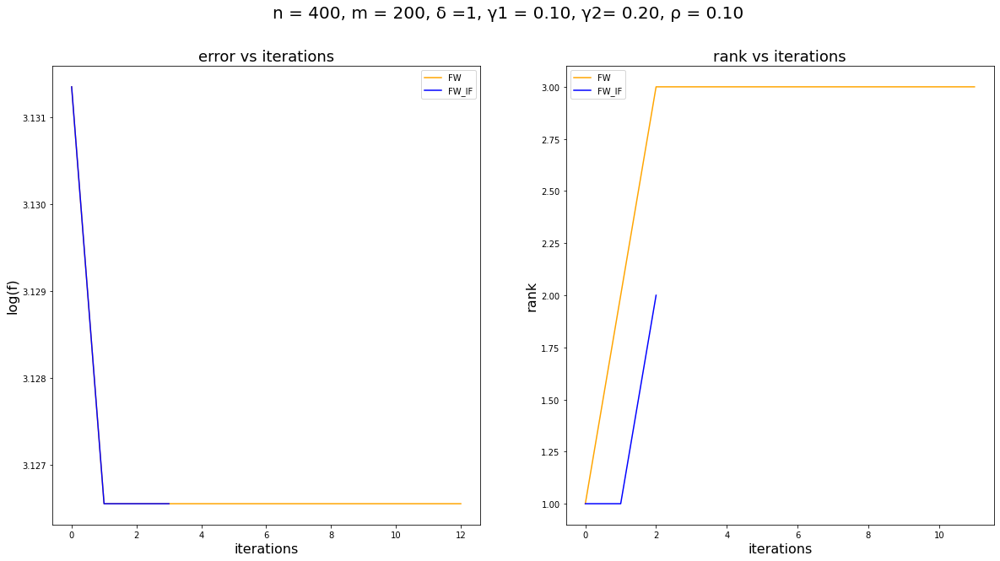

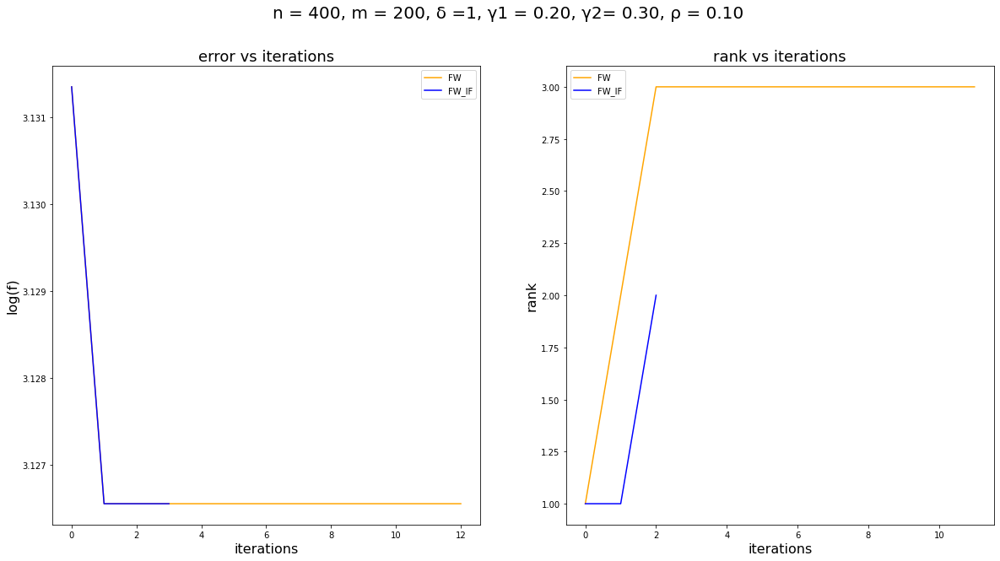

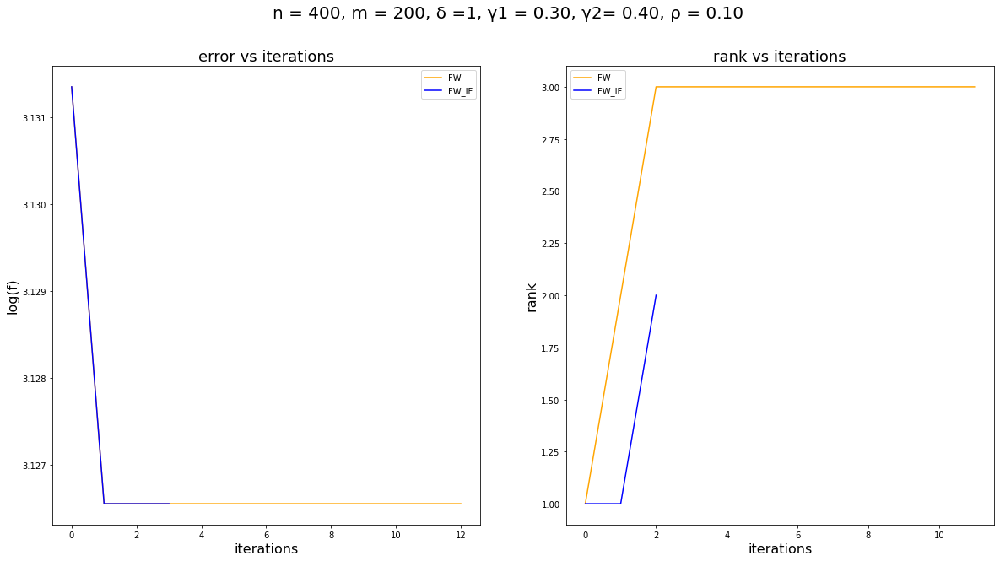

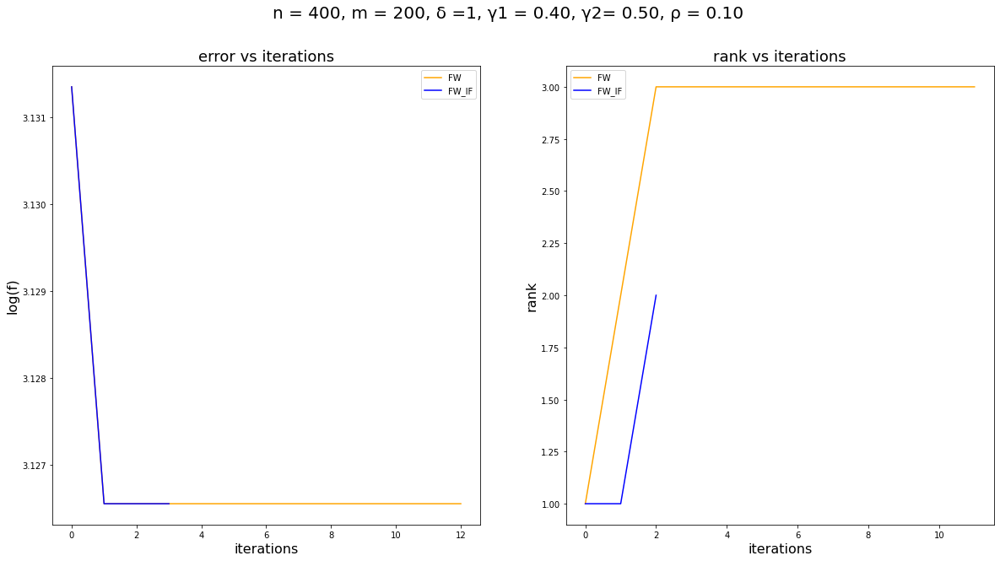

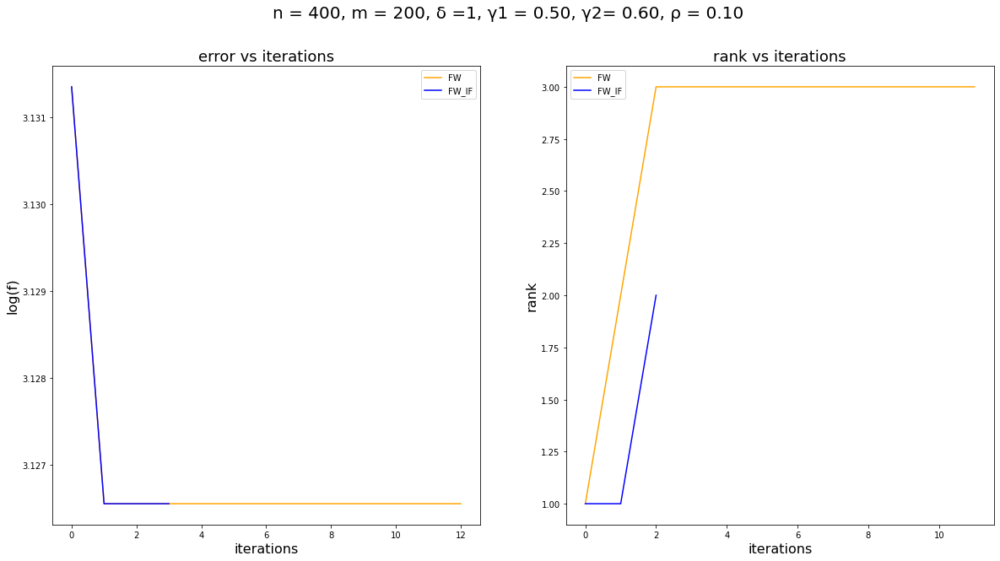

...

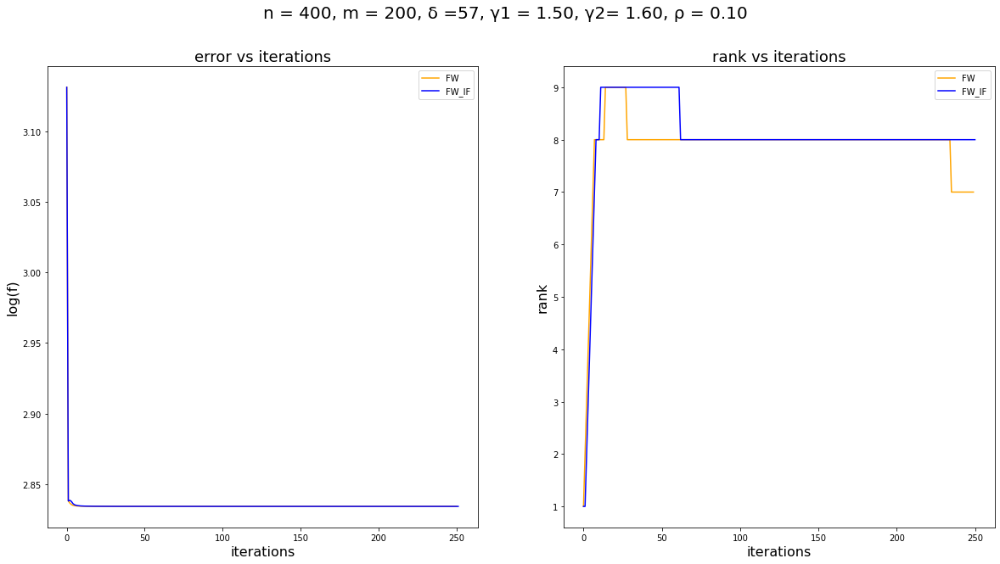

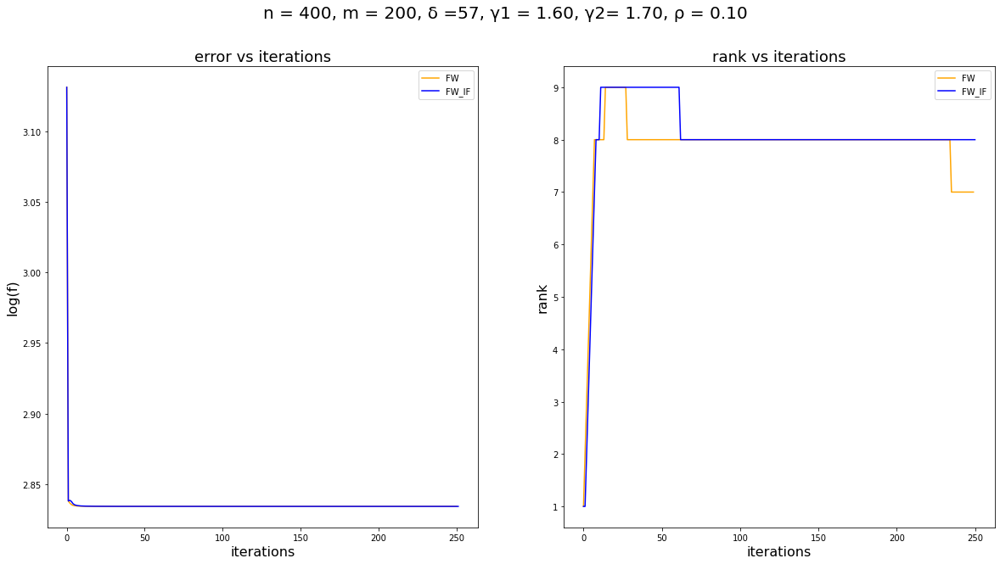

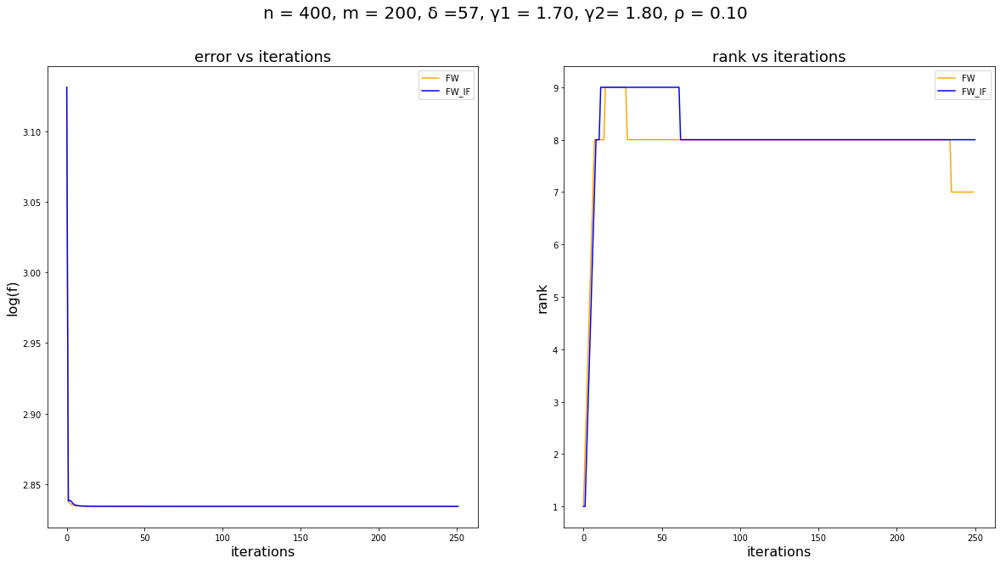

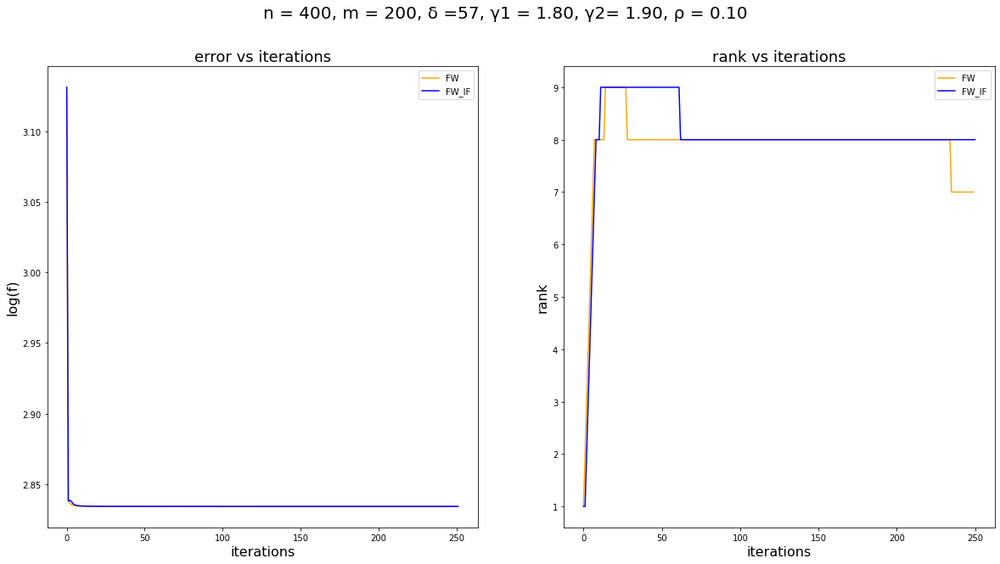

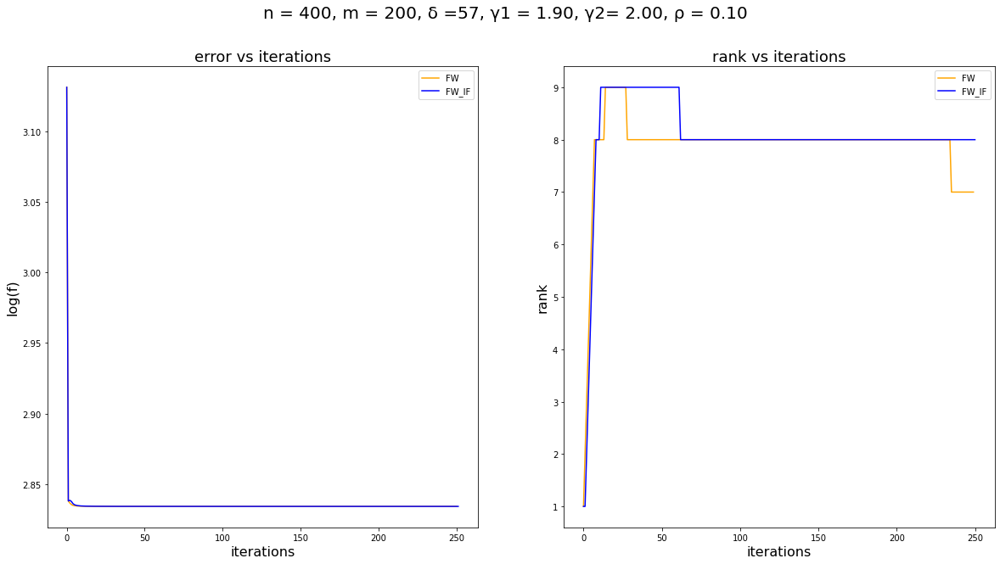

In [11]:
n = 400
m = 200
rho = 0.1

#This is outside for loop because this way it's always the same data
X_test = data_generation(n, m, rho)


for i in range(1, 60, 4):
    delta = i
    for i in range(1,20): 
        gamma1 = i*0.1
        gamma2 = (i*0.1)+0.1
        pred_ratings_reg, loss_reg, loss_track_reg, ranks_reg = FrankWolfe(X_test, FW_objective_function, delta = delta, max_iter=250, patience=1e-7, printing_res = False)
        pred_ratings_inface, loss_inface, loss_track_inface, ranks_inface = FW_inface(X_test, FW_objective_function, gamma1 = gamma1, gamma2 = gamma2 , delta = delta, THRES = 10, max_iter = 250, patience = 1e-7, printing=False)
        fig = plt.figure(figsize = (20,10))
        fig.suptitle(t = 'n = %i, m = %i, δ =%i, γ1 = %.2f, γ2= %.2f, ρ = %.2f'%(n, m, delta, gamma1, gamma2, rho), fontsize=20)
        ax1 = fig.add_subplot(121)
        ax1.set_title(label = 'error vs iterations' , fontsize = 18)
        ax1.set_xlabel('iterations', size = 16)
        ax1.set_ylabel('log(f)',size = 16)
        ax1.plot(np.log10(loss_track_reg), label = 'FW', color = 'orange')
        ax1.plot(np.log10(loss_track_inface), label = 'FW_IF', color = 'blue')
        ax1.legend(loc = 'best')
        ax2 = fig.add_subplot(122)
        ax2.set_title(label = 'rank vs iterations', fontsize = 18)
        ax2.set_xlabel('iterations', size = 16)
        ax2.set_ylabel('rank',size = 16)
        ax2.plot(ranks_reg, label = 'FW', color = 'orange')
        ax2.plot(ranks_inface, label = 'FW_IF', color = 'blue')
        ax2.legend(loc = 'best')
        plt.savefig('/home/kabo/Documents/Optimization/deltatry/n=%i_m=%i_δ =%i_γ1=%.2f_γ2= %.2f_ρ=%.2f.png'%(n, m, delta, gamma1, gamma2, rho))

# Frank Wolfe on Goodreads dataset

In [4]:
# FW objective function
def FW_objective_function(diff_vec):
    return 0.5*(np.power(diff_vec,2).sum())

# Regular FW algorithm
def FrankWolfeGoodreads(X, objective_function, delta, empties = 0, printing_res = True, Z_init = None, max_iter = 150, patience = 1e-3):
    '''
    :param X: sparse matrix with ratings and 'empty values', rows - users, columns - books.
    :param objective_function: objective function that we would like to minimize with FW
    :param delta: Radius of the feasible's set ball
    :param empties (optional): Empty values of X are zeros (0) or NaN ('nan'). Default = 0
    :param Z_init (optional): In case we want to initialize Z with a known matrix, if not given Z_init will be a zeros matrix. Default = None.
    :param max_iter (optional): max number of iterations for the method. Default = 150.
    :param patience (optional): once reached this tolerance provide the result. Default = 1e-3.
    :return: Z: matrix of predicted ratings - it should be like X but with no 'empty values'
    :return: accuracy: difference between original values (X) and predicted ones (Z)
    '''
    ranks = []
    # Get X indexes for not empty values
    if empties == 0:
        idx_ratings = np.argwhere(X != 0)
    elif empties == 'nan':
        idx_ratings = np.argwhere(~np.isnan(X))
    else:
        return print('Error: Empties argument', empties, 'not valid.')

    idx_rows = idx_ratings[:,0]
    print(idx_rows.shape)
    idx_cols = idx_ratings[:,1]
    print(idx_cols.shape)

    # Initialize Z
    if Z_init == 'random uniform':
        Z = np.random.uniform(low = 0.01, high = 1, size = X.shape)
    elif Z_init is not None:
        Z = Z_init
    else:
        Z = np.zeros(X.shape)

    # Create vectors with the not empty features of the sparse matrix
    X_rated = X[idx_rows, idx_cols]
    Z_rated = Z[idx_rows, idx_cols]
    #diff_vec = np.array(Z_rated - X_rated)[0]
    diff_vec = Z_rated - X_rated
    print(diff_vec.shape)
    # Create needed variables
    diff_loss = patience + 1
    loss = objective_function(diff_vec)
    res_list = [loss]
    it = 0
    while (diff_loss > patience) and (it < max_iter):

        # Gradient
        grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))

        # SVD - Compute k = 1 singular values and its vectors, starting from the largest (which = 'LM')
        u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')   #

        # Update
        Zk_tilde = -delta*np.outer(u_max,v_max)

        alpha_k = 2/(it+2) #alpha - as studied in class
        Z = (1-alpha_k)*Z + alpha_k*Zk_tilde

        # Loss
        diff_vec = (Z[idx_rows, idx_cols] - X_rated)
        #diff_vec = np.array(Z[idx_rows, idx_cols] - X_rated)[0]
        new_loss = objective_function(diff_vec)

        # Improvement at this iteration
        diff_loss = np.abs(loss - new_loss)
        loss = new_loss

        if printing_res == True:
            if it == 1 or it % 5 == 0:
                print('Iteration:', it, 'Loss:', loss, 'Loss diff:', diff_loss)

        # Count iteration
        it += 1
        ranks.append(np.linalg.matrix_rank(Z))
        res_list.append(loss)
        
    return Z, loss, res_list, ranks

In [5]:
def FW_infaceGoodreads(X, objective_function, delta, L = 1, D = None, gamma1 = 0, gamma2 = 1, THRES = 0.001, empties = 0, max_iter=150, patience=1e-3, printing = True):
    '''
    :param X: sparse matrix with ratings and 'empty values', rows - users, columns - books.
    :param objective_function: objective function that we would like to minimize with FW.
    :param delta: Radius of the feasible's set ball
    :param L: must be greater than 1
    :param D: if not inputed = 2*delta
    :param gamma1:
    :param gamma2:
    :param THRES:
    :param empties (optional): Empty values of X are zeros (0) or NaN ('nan'). Default = 0
    :param max_iter: max number of iterations for the method.
    :param patience: once reached this tolerance provide the result.
    :return: Z: matrix of predicted ratings - it should be like X but with no 'empty values'
            loss: difference between original values (X) and predicted ones (Z).
    '''

    # Get X indexes for not empty values
    if empties == 0:
        idx_ratings = np.argwhere(X != 0)
    elif empties == 'nan':
        idx_ratings = np.argwhere(~np.isnan(X))
    else:
        return print('Empties argument', empties, 'not valid.')

    idx_rows = idx_ratings[:,0]
    idx_cols = idx_ratings[:,1]

    # Initialize Z_{-1}
    Z_1 = np.zeros(X.shape)

    # Create vectors with the not empty features of the sparse matrix
    X_rated = X[idx_rows, idx_cols]
    Z_rated = Z_1[idx_rows, idx_cols]
    #diff_vec_1 = np.array(Z_rated - X_rated)[0]
    diff_vec_1 = Z_rated - X_rated

    # Initial gradient and Z0
    grad_1 = sparse.csr_matrix((diff_vec_1, (idx_rows, idx_cols)))
    u_max, s_max, v_max = sparse.linalg.svds(grad_1, k = 1, which='LM')
    Zk = -delta*np.outer(u_max,v_max)
    Z_rated = Zk[idx_rows, idx_cols]

    print('Initial Zk Rank: ', LA.matrix_rank(Zk))

    # Initialize lower bound on the optimal objective function (f*)
    #diff_vec = np.array(Z_rated - X_rated)[0]
    diff_vec = Z_rated - X_rated

    #new_low_bound = np.max((objective_function(diff_vec_1) + np.multiply(grad_1.toarray(),Zk).sum()), 0)
    new_low_bound = 0
    #new_low_bound = np.max((objective_function(diff_vec_1) + (grad_1.dot(Zk)).trace()), 0)
    #new_low_bound = 0 #used 0 otherwise the other new_low_bound was too high!

    # Set D
    if D is not None:
        D = D
    else:
        D = 2*delta

    rank_Z = LA.matrix_rank(Zk)   # rank of Zk to find thin SVD size

    # Additional needed parameters
    diff_loss = patience + 1
    loss = objective_function(diff_vec)
    it = 0
    res_list = [objective_function(diff_vec_1), loss]
    ranks = [rank_Z]
    not_in_ball=False

    B_used = 0
    A_used = 0
    not_entered = 0
    regularFW = 0

    in_border = 0
    inside = 0
    outside = 0

    while (diff_loss > patience) and (it < max_iter):

        # Thin SVD
        U_thin, s_thin, Vh_thin = sparse.linalg.svds(Zk, k = rank_Z, which='LM')   # Compute k = rank singular values

        # Lower bound update
        low_bound = new_low_bound

        # Gradient
        grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))

        # In-face direction with the away step strategy: two calculations depending of where Z lies within the feasible set
        if s_thin.sum() == delta: # Z in border (sum of singular values == radius of feasible set)
            in_border += 1
            G = 0.5 * (Vh_thin.dot(grad.T.dot(U_thin)) + U_thin.T.dot(grad.dot(Vh_thin.T)))
            # Obtain unitary eigenvector corresponding to smallest eigenvalue of G
            eigvalues, eigvectors = LA.eig(G)  #find the eigenvalues
            min_eig = np.argmin(eigvalues)  #find the index of the smallest eigenvalue
            u = eigvectors[:, min_eig]  #take the eigenvector corresponding to the smallest eigenvalue

            # Update value
            M = np.outer(u,u.T)
            Zk_tilde = delta*U_thin.dot(M.dot(Vh_thin))
            Dk = Zk - Zk_tilde

            inv_s_thin = np.diag(1/s_thin)
            alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)

        elif s_thin.sum() < delta: #inside
            inside += 1
            u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
            Zk_tilde = delta*np.outer(u_max,v_max)
            Dk = Zk - Zk_tilde
            #BINARY SEARCH

            alpha_stop = alpha_binary_search(Zk,
                                          Dk,
                                          delta)

            #alpha_stop = 0.5
        else:
            not_in_ball = True
            outside += 1

        nuclear_norm = s_thin.sum()
        # We check if Zk is inside the feasible set and the rank in order to decide which type steps to do
        if rank_Z > 1 and not_in_ball==False:
            Z_B = Zk + alpha_stop*Dk
        #    diff_vec_B = np.array(Z_B[idx_rows, idx_cols] - X_rated)[0]
            diff_vec_B = Z_B[idx_rows, idx_cols] - X_rated
            if 1/(objective_function(diff_vec_B)-low_bound) >= (1/(loss-low_bound)+gamma1/(2*L*D**2)):
                # 1. Move to a lower dimensional face
                B_used += 1
                Zk = Z_B

            else:
                beta = alpha_stop/5 # FIND A GOOD VALUE -- a binary search is also suggested by the paper
                Z_A = Zk + beta*Dk
                diff_vec_A = Z_A[idx_rows, idx_cols] - X_rated
 #               diff_vec_A = np.array(Z_A[idx_rows, idx_cols] - X_rated)[0]
                if 1/(objective_function(diff_vec_A)-low_bound) >= (1/(loss-low_bound)+gamma2/(2*L*D**2)):
                    # 2. Stay in the current face
                    A_used += 1
                    Zk = Z_A
                else:
                    # 3. Do a regular FW step and update the lower bound
                    regularFW += 1
                    #Zk update
                    u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
                    Zk_tilde = -delta*np.outer(u_max,v_max)

                    '''# Lower bound update
                    B_w = loss + grad.T.dot(Zk_tilde - Zk)
                    print(B_w, low_bound)
                    new_low_bound = np.max(low_bound, B_w)'''

                    direction_vec = Zk_tilde.flatten() - Zk.flatten()
                    grad = grad.toarray()
                    wolfe_gap = grad.T.flatten() * direction_vec
                    B_w = loss + wolfe_gap.sum()

                    #TRIED THIS INSTEAD
                    if low_bound >= B_w:
                        new_low_bound = low_bound
                    else:
                        new_low_bound = B_w

                    # Z_(k+1)
                    alpha_k = 2/(it+2)
                    Zk = (1-alpha_k)*Zk + alpha_k*Zk_tilde

        else:

            # 3. Do a regular FW step and update the lower bound
            not_entered += 1
            #Zk update
            grad = sparse.csr_matrix((diff_vec, (idx_rows, idx_cols)))
            u_max, s_max, v_max = sparse.linalg.svds(grad, k = 1, which='LM')
            Zk_tilde = -delta*np.outer(u_max,v_max)

            '''# Lower bound update
            B_w = loss + grad.T.dot(Zk_tilde - Zk)
            print(B_w, low_bound)
            new_low_bound = np.max(low_bound, B_w)'''

            direction_vec = Zk_tilde.flatten() - Zk.flatten()
            grad = grad.toarray()
            wolfe_gap = grad.T.flatten() * direction_vec
            B_w = loss + wolfe_gap.sum()

            #TRIED THIS INSTEAD
            if low_bound >= B_w:
                new_low_bound = low_bound
            else:
                new_low_bound = B_w

            # Z_(k+1)
            alpha_k = 2/(it+2)
            Zk = (1-alpha_k)*Zk + alpha_k*Zk_tilde

            not_in_ball=False

        # Loss
        #diff_vec = np.array(Zk[idx_rows, idx_cols] - X_rated)[0]
        diff_vec = Zk[idx_rows, idx_cols] - X_rated
        new_loss = objective_function(diff_vec)

        # Improvement at this iteration
        diff_loss = np.abs(loss - new_loss)
        loss = new_loss

        rank_Z = LA.matrix_rank(Zk)   # rank of Zk to find thin SVD size

        # Count iteration
        it += 1

        res_list.append(loss)
        ranks.append(rank_Z)
        if printing == True:
            if it % 5 == 0 or it == 1:
                print('Iteration:', it, 'Loss:', loss, 'Loss diff:', diff_loss, 'Rank(Z): ', rank_Z)

    print('Went to lower dim face:', B_used)
    print('Stayed:', A_used)
    print('Regular:', regularFW)
    print('Not entered if:', not_entered)

    print('in_border:', in_border)
    print('Inside ball:', inside)
    print('Outside ball:', outside)
    return Zk, loss, res_list, ranks


In [6]:
import numpy as np
import pandas as pd

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)

In [7]:
path = 'goodreads_cleaned.csv'
#path = 'DATA/goodreads_cleaned.csv'
df = pd.read_csv(path, sep = ";")
df['book_id_count'] = df.groupby('book_id')['book_id'].transform('count')
df['user_id_count'] = df.groupby('user_id')['user_id'].transform('count')

book_quantile = 0.95
user_quantile = 0.9

df = df.loc[(df.book_id_count >= df.book_id.value_counts().quantile(book_quantile)) & (df.user_id_count >= df.user_id.value_counts().quantile(user_quantile)),:]

In [8]:
df = pd.pivot_table(df, columns="book_id", index="user_id", values="rating")
df.head(10)

book_id,1,2,3,5,6,11,34,830,865,890,902,930,960,968,1103,1232,1617,1618,1622,1845,1885,1934,1953,2156,2165,2187,2493,2526,2623,2657,2744,2839,2998,3431,3473,3636,3682,4214,4381,4407,4588,4671,4929,4981,5043,5107,5129,5297,5364,5470,...,28374007,28449207,28458598,28477789,28588345,28597587,28678119,28686840,28763485,28862528,28954189,28962906,29008738,29056083,29069989,29236299,29237211,29283884,29367958,29385546,29396738,29519514,29519517,29541818,29610595,29772863,29780253,29868610,29939230,29939390,29991719,30075802,30095464,30117284,30226723,30253864,30256248,30312891,30555488,30653853,30724132,31140847,31450852,31451174,31931941,32075662,32075671,32571395,33232571,35247769
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00238d8a4c276c47f5d5e242f54a8f28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
002a023d3de233b4bd3ec4fc3e9c581a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,4.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
006f552534b15a7358a125f7505e0eea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
009235f414f42cfd0f76282f6aefe6c1,NaN,NaN,5.0,5.0,4.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,5.0,NaN
009a47e49c0dc6e84d1c5e0eb4cdf7f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
00b5b129cc3cfa6511418cce1cec54ab,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,4.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,5.0,4.0,NaN,NaN,NaN,NaN,NaN,5.0,NaN,5.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01001347e5bab7241212a0a6910260f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0102db8db2097cd4482ebc20b7b2d5be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,N

In [9]:
df.reset_index(drop=True)
df

book_id,1,2,3,5,6,11,34,830,865,890,902,930,960,968,1103,1232,1617,1618,1622,1845,1885,1934,1953,2156,2165,2187,2493,2526,2623,2657,2744,2839,2998,3431,3473,3636,3682,4214,4381,4407,4588,4671,4929,4981,5043,5107,5129,5297,5364,5470,...,28374007,28449207,28458598,28477789,28588345,28597587,28678119,28686840,28763485,28862528,28954189,28962906,29008738,29056083,29069989,29236299,29237211,29283884,29367958,29385546,29396738,29519514,29519517,29541818,29610595,29772863,29780253,29868610,29939230,29939390,29991719,30075802,30095464,30117284,30226723,30253864,30256248,30312891,30555488,30653853,30724132,31140847,31450852,31451174,31931941,32075662,32075671,32571395,33232571,35247769
user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
00238d8a4c276c47f5d5e242f54a8f28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
002a023d3de233b4bd3ec4fc3e9c581a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,4.0,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
006f552534b15a7358a125f7505e0eea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
009235f414f42cfd0f76282f6aefe6c1,NaN,NaN,5.0,5.0,4.0,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,5.0,NaN
009a47e49c0dc6e84d1c5e0eb4cdf7f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ffbf525357e96614c4b9ee613aa95caa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ffd6c966d94d3d06c8cc4480536082b4,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,5.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [10]:
df = (df + 1)/6
df.dropna(axis=0, how='all', inplace=True)
df.dropna(axis=1, how='all', inplace=True)
data_matrix = df.to_numpy(na_value=np.nan)
print(data_matrix)

[[       nan        nan        nan ...        nan        nan        nan]
 [       nan        nan        nan ...        nan        nan        nan]
 [       nan        nan        nan ...        nan        nan        nan]
 ...
 [       nan        nan        nan ...        nan        nan        nan]
 [       nan        nan        nan ...        nan        nan        nan]
 [       nan 1.                nan ... 0.66666667        nan        nan]]


In [11]:
idx = np.argwhere(~np.isnan(data_matrix))
print(idx)

[[   0   65]
 [   0   79]
 [   0  204]
 ...
 [1217 1223]
 [1217 1236]
 [1217 1273]]


In [12]:
new_data = np.nan_to_num(data_matrix, 0)

print(new_data)

print(np.linalg.matrix_rank(new_data))

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         1.         0.         ... 0.66666667 0.         0.        ]]
1218


In [ ]:

for i in [0,1,2,3,4,5]:
    delta = 1000+(i*200)
    #for i in range(1,10): 
    gamma1 = 0
    gamma2 = 1
    pred_ratings_reg, loss_reg, loss_track_reg, ranks_reg = FrankWolfeGoodreads(new_data, FW_objective_function, delta = delta, max_iter=200, patience=1e-7, printing_res = False)
    pred_ratings_inface, loss_inface, loss_track_inface, ranks_inface = FW_infaceGoodreads(new_data, FW_objective_function, gamma1 = gamma1, gamma2 = gamma2 , delta = delta, THRES = 10, max_iter = 200, patience = 1e-7, printing=False)
    fig = plt.figure(figsize = (20,10))
    fig.suptitle(t = 'GoodReads δ =%i, γ1 = %.2f, γ2= %.2f'%(delta, gamma1, gamma2), fontsize=20)
    ax1 = fig.add_subplot(121)
    ax1.set_title(label = 'error vs iterations' , fontsize = 18)
    ax1.set_xlabel('iterations', size = 16)
    ax1.set_ylabel('log(f)',size = 16)
    ax1.plot(np.log10(loss_track_reg), label = 'FW', color = 'orange')
    ax1.plot(np.log10(loss_track_inface), label = 'FW_IF', color = 'blue')
    ax1.legend(loc = 'best')
    ax2 = fig.add_subplot(122)
    ax2.set_title(label = 'rank vs iterations', fontsize = 18)
    ax2.set_xlabel('iterations', size = 16)
    ax2.set_ylabel('rank',size = 16)
    ax2.plot(ranks_reg, label = 'FW', color = 'orange')
    ax2.plot(ranks_inface, label = 'FW_IF', color = 'blue')
    ax2.legend(loc = 'best')
    plt.savefig('/home/kabo/Documents/Optimization/DataMatrixPlots/Improved/goodreads_δ =%i_γ1 = %.2f_γ2= %.2f.png'%(delta, gamma1, gamma2))

(114041,)
(114041,)
(114041,)
Initial Zk Rank:  1


<ipython-input-5-b2d61c2f310f>:106: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Went to lower dim face: 13
Stayed: 0
Regular: 10
Not entered if: 177
in_border: 1
Inside ball: 24
Outside ball: 175
(114041,)
(114041,)
(114041,)
Initial Zk Rank:  1


<ipython-input-5-b2d61c2f310f>:106: RuntimeWarning: divide by zero encountered in double_scalars
  alpha_stop = 1/(delta*u.T.dot(inv_s_thin.dot(u))-1)


Went to lower dim face: 14
Stayed: 2
Regular: 108
Not entered if: 76
in_border: 1
Inside ball: 124
Outside ball: 75
(114041,)
(114041,)
(114041,)
Initial Zk Rank:  1
Went to lower dim face: 18
Stayed: 1
Regular: 41
Not entered if: 140
in_border: 0
Inside ball: 61
Outside ball: 139
(114041,)
(114041,)
(114041,)
Initial Zk Rank:  1
Went to lower dim face: 18
Stayed: 1
Regular: 40
Not entered if: 141
in_border: 0
Inside ball: 59
Outside ball: 141
(114041,)
(114041,)
(114041,)
